In [2]:
pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 14.6 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [45]:
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql.functions import sum, max, min, avg, count, mean, round
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
from pyspark.sql.types import StringType

In [3]:
spark = SparkSession.builder.appName('Read CSV File into DataFrame').getOrCreate()

In [51]:
df = spark.read.csv('../data/zip_code_demographics.csv', inferSchema=True, header=True)

## number of returns by county

In [53]:
returns_by_county = df[['number_of_returns','county_name']]

In [54]:
returns_by_county.show()

+-----------------+-----------+
|number_of_returns|county_name|
+-----------------+-----------+
|             9320|    Hampden|
|             9880|  Hampshire|
|             2490|  Worcester|
|             7970|  Hampshire|
|              660|    Hampden|
|             1980|    Hampden|
|              630|    Hampden|
|              410|  Hampshire|
|            11270|    Hampden|
|            15760|    Hampden|
|             1180|    Hampden|
|              520|  Hampshire|
|            10070|  Hampshire|
|             8540|    Hampden|
|             6170|    Hampden|
|              570|  Worcester|
|              270|  Hampshire|
|             3370|  Hampshire|
|             1040|    Hampden|
|             2920|  Hampshire|
+-----------------+-----------+
only showing top 20 rows



In [55]:
plot_returns = returns_by_county.groupBy('county_name').sum('number_of_returns') 

In [56]:
plot_returns.show()

+--------------+----------------------+
|   county_name|sum(number_of_returns)|
+--------------+----------------------+
|     Worcester|                476700|
|         Bucks|                384940|
|       Hanover|                 72920|
|         Tyler|                 14530|
|        Aitkin|                  9300|
|     Petroleum|                   180|
|      Thurston|                170330|
|East Feliciana|                  8950|
|        Grimes|                 15660|
|          Utah|                301400|
|    Charleston|                251190|
|         Pasco|                274050|
|     Oktibbeha|                 34110|
|      Montcalm|                 32250|
|    Deer Lodge|                  8900|
|       Shannon|                  3400|
|         Izard|                  5740|
|      Angelina|                 51190|
|        Cayuga|                 56630|
|      McDowell|                 40840|
+--------------+----------------------+
only showing top 20 rows



In [11]:
df_plot = plot_returns.toPandas()

In [12]:
plot_returns.summary().show()

+-------+-----------+----------------------+
|summary|county_name|sum(number_of_returns)|
+-------+-----------+----------------------+
|  count|       1800|                  1800|
|   mean|       NULL|    100023.61666666667|
| stddev|       NULL|    258816.38111612992|
|    min|  Abbeville|                   130|
|    25%|       NULL|                  7720|
|    50%|       NULL|                 23120|
|    75%|       NULL|                 79920|
|    max|    Ziebach|               5111780|
+-------+-----------+----------------------+



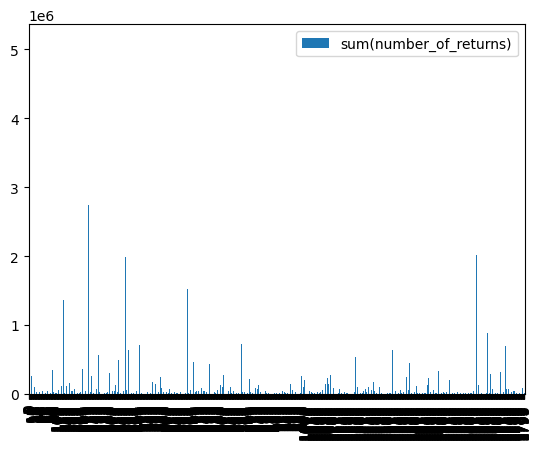

In [13]:
df_plot.plot(kind='bar')
plt.show()
#test

In [14]:
fig = px.scatter(df_plot,
                 x='sum(number_of_returns)',
                 y='county_name',
                 title='Tax Returns By County')
fig.show()


## Distance highway/airport Pop by zipcode

In [15]:
highway_airport = df[['dist_highway','dist2_large_airport','dist2_medium_airport','population','zip']]

In [23]:
hw_air.tail()

,dist_highway,dist2_large_airport,dist2_medium_airport,population,zip
33699,29.611385,95.336980,35.052347,15158,28388
33700,34.660884,134.931257,62.822117,10318,28765
33701,1.148362,15.509671,6.927500,21622,40027
33702,1.017999,5.082523,6.724578,12029,40292
33703,1.381451,46.050739,6.492610,1723,44316


In [25]:
highway_airport.show()

+------------------+-------------------+--------------------+----------+----+
|      dist_highway|dist2_large_airport|dist2_medium_airport|population| zip|
+------------------+-------------------+--------------------+----------+----+
|  1.38703489958776|   106.145765467407|    12.9462123500772|     16088|1001|
|  14.4381771787811|   112.264368137872|    21.0800788136799|     27323|1002|
|  16.7883389378764|    90.664964214599|    25.5477180736873|      4947|1005|
|   13.663839468365|   101.552921217705|     14.762395370048|     15304|1007|
|  2.59365546872497|    136.54879743219|    20.1779499690055|      1171|1008|
|  4.73727136188264|   78.6454995903817|    28.0492624787917|      3703|1010|
|  8.05869305726245|   142.414627001912|    26.0419084149722|      1332|1011|
|  18.3310957824545|   138.381683922713|    27.4666636064825|       503|1012|
|0.0622862708325111|   109.114246004907|    7.07589281728133|     22709|1013|
| 0.925139778004274|   106.769094716986|    3.20553313229515|   

In [32]:
highway_airport_2 = highway_airport.select('zip','population',round('dist_highway', 2).alias('highway_dist'),round('dist2_large_airport', 2).alias('dist_large_airport'),round('dist2_medium_airport', 2).alias('dist_medium_airport'))

In [46]:
highway_airport_2.dtypes

[('zip', 'int'),
 ('population', 'int'),
 ('highway_dist', 'double'),
 ('dist_large_airport', 'double'),
 ('dist_medium_airport', 'double')]

In [57]:
highway_airport_2 = highway_airport_2.withColumn('zips', highway_airport_2['zip'].cast(StringType()))

In [58]:
highway_airport_2.show()

+----+----------+------------+------------------+-------------------+----------+----+
| zip|population|highway_dist|dist_large_airport|dist_medium_airport|zip_string|zips|
+----+----------+------------+------------------+-------------------+----------+----+
|1001|     16088|        1.39|            106.15|              12.95|      1001|1001|
|1002|     27323|       14.44|            112.26|              21.08|      1002|1002|
|1005|      4947|       16.79|             90.66|              25.55|      1005|1005|
|1007|     15304|       13.66|            101.55|              14.76|      1007|1007|
|1008|      1171|        2.59|            136.55|              20.18|      1008|1008|
|1010|      3703|        4.74|             78.65|              28.05|      1010|1010|
|1011|      1332|        8.06|            142.41|              26.04|      1011|1011|
|1012|       503|       18.33|            138.38|              27.47|      1012|1012|
|1013|     22709|        0.06|            109.11|     

In [61]:
highway_airport_2.drop('zip_string')

DataFrame[zip: int, population: int, highway_dist: double, dist_large_airport: double, dist_medium_airport: double, zips: string]

In [59]:
hw_air = highway_airport_2.toPandas()

In [60]:
fig = px.scatter(hw_air,
                 x='zips',
                 y='population',
                 hover_data=['highway_dist', 'dist_large_airport', 'dist_medium_airport'], # Add other columns to display on hover
                 
                 title='Population by zipcode with distance to Highway and Airports in miles')
fig.show()


In [39]:
hw_air.head()

,zip,population,highway_dist,dist_large_airport,dist_medium_airport
0,1001,16088,1.39,106.15,12.95
1,1002,27323,14.44,112.26,21.08
2,1005,4947,16.79,90.66,25.55
3,1007,15304,13.66,101.55,14.76
4,1008,1171,2.59,136.55,20.18
